<p style="font-size:25px">Name of this Notebook <br> </p> <p style="font-size:30px"> Prosodies-to-NOTATION</p> <br>
Transcription of musical notes and conversion from .wav to MIDI
This notebook combines two other notebooks of an earlier, pilot project. These earlier notebooks are not available but the owner still have them for reference, if needed. Their original names, now replaced by Prosodies-in-NOTATION, are Teste_MIDI_to_CSV e Teste_transcricao_de_notas.

In [2]:
# Installation of all necessary libraries for the notebook.
# This cell only needs to be run once for installation.
# Instalação de todas as bibliotecas necessárias para o notebook.
# Esta célula só precisa ser executada uma vez para instalação.

!pip install praat-parselmouth
!pip install plotly
!pip install py-midicsv

--------------------------
<p style="font-size:20px"> Import of Libraries </p>

In [3]:
import parselmouth # Praat wrapper
from IPython.display import Audio # Audio manipulation library

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import warnings
import pandas as pd

# plotly offline
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.offline as pyo
from plotly.offline import init_notebook_mode # to plot in jupyter notebook

import py_midicsv as pm
import pandas as pd

import f0_extraction as f0

---------------------------
<p style="font-size:20px"> Definition of Functions Used in the Code </p>

In [4]:
################################################################
# Auxiliary functions for viewing extracted data
# Funções auxiliares para visualização dos dados extraídos
################################################################

def draw_pitch(pitch):
    # Extract selected pitch contour, and
    # replace unvoiced samples by NaN to not plot
    pitch_values = pitch.selected_array['frequency']
    pitch_values[pitch_values==0] = np.nan
    plt.plot(pitch.xs(), pitch_values, 'o', markersize=5, color='w')
    plt.plot(pitch.xs(), pitch_values, 'o', markersize=2)
    plt.grid(False)
    plt.ylim(0, pitch.ceiling)
    plt.ylabel("fundamental frequency [Hz]")
    
def draw_spectrogram(spectrogram, dynamic_range=35):
    X, Y = spectrogram.x_grid(), spectrogram.y_grid()
    sg_db = 10 * np.log10(spectrogram.values)
    plt.pcolormesh(X, Y, sg_db, vmin=sg_db.max() - dynamic_range, cmap='afmhot')
    plt.ylim([spectrogram.ymin, spectrogram.ymax])
    plt.xlabel("time [s]")
    plt.ylabel("frequency [Hz]")

def draw_intensity(intensity):
    plt.plot(intensity.xs(), intensity.values.T, linewidth=3, color='w')
    plt.plot(intensity.xs(), intensity.values.T, linewidth=1)
    
    # Plot of intensity acceleration (numeric delta by np.diff())
    plt.plot(intensity.xs(),np.add(10,np.diff(np.hstack((0,intensity.values.T.reshape(-1))),n=1)),linewidth=3, color='w')
    
    plt.grid(False)
    plt.ylim(0)
    plt.ylabel("intensity [dB]")

# If it is necessary to use Plotly outside the local computer (in Google Collab for example, it might be 
# necessary to define the function below and call it whenever someone wants to display a graph
# Se for necessário usar o Plotly estar sendo utilizado fora do computador local (no Google Collab, e' preciso definir
# por exemplo), talvez seja necessário definir a função abaixo e chamá-la sempre que se quiser exibir um gráfico

def configure_plotly_browser_state():
  import IPython
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-1.43.1.min.js?noext',
            },
          });
        </script>
        '''))

# Function to return an interactive free object plotly
# Função para retornar um objeto gratico interativo plotly

def draw_interactive_spectrogram(spectrogram, intensity, pitch, dynamic_range=65):
    # Plot with plotly
    #configure_plotly_browser_state()
    X, Y = spectrogram.x_grid(), spectrogram.y_grid()
    sg_db = 10 * np.log10(spectrogram.values)

    pitch_values = pitch.selected_array['frequency']
    pitch_values[pitch_values==0] = np.nan
 

    # Create figure with secondary y-axis
    
    fig = make_subplots(specs=[[{"secondary_y": True}]])

    fig.add_trace(go.Heatmap(
        x= X,
        y= Y,
        z= sg_db,
        zmax=sg_db.max(),
        zmin=sg_db.max()-dynamic_range,
        name='Freq',
        colorscale='hot',
        ))

    fig.add_trace(go.Scatter(x=pitch.xs(), y=pitch_values, name='F0',line_shape='linear',
                            line=dict(color='whitesmoke', width=5)))

    fig.add_trace(go.Scatter(x=pitch.xs(), 
                             y=np.add(np.mean(np.nan_to_num(pitch_values,nan=np.mean(np.nan_to_num(pitch_values,nan=0)))),
                                      np.diff(np.hstack((np.nan,pitch_values)),n=1)),
                             name='F0 Acceleration',line_shape='linear',
                             line=dict(color='lawngreen', width=2)),secondary_y=False)
    

    fig.add_trace(go.Scatter(x=intensity.xs(),
                             y=intensity.values.reshape(-1)/np.max(intensity.values.reshape(-1)),
                             name='Energy',line_shape='linear',
                             line=dict(color='cornsilk', width=3,dash='dashdot')),secondary_y=True)
    
    fig.add_trace(go.Scatter(x=intensity.xs(), 
                             y=np.diff(np.hstack((0,intensity.values.reshape(-1))),n=1)/np.max(intensity.values.reshape(-1)),
                             name='Energy Acceleration',line_shape='linear',
                             line=dict(color='lightblue', width=2)),secondary_y=True)
    
    
    fig.update_layout(legend_orientation="h")

    fig.update_layout(
      title = 'Spectrogram with F0',
      yaxis_type="linear"
    )
    fig.update_xaxes (title_text="Time in Seconds")
    fig.update_yaxes(title_text='Frequency in Hz (Log scale)' )
    fig.update_yaxes(title_text="<b>Energy Intensity</b>", secondary_y=True)

    return fig

##################################################################
# Function for converting the frequency and note dataframe into one
# MIDICSV file
# Função para conversão do dataframe de frequencias e notas em um
# arquivo MIDICSV
##################################################################

def pitch_f0_tomidi(df):
    j=0 # Counter variable to ignore continuity of the same note - Variável contador para ignorar continuidade da mesma nota
    i=5 # MIDICSV file index variable - Variável de indice do arquivo MIDICSV

    # Variavel auxiliar com o fluxo MIDICSV e seu cabeçalho inicial
    aux = [  '0, 0, Header, 1, 2, 192\n',
             '1, 0, Start_track\n',
             '1, 0, Time_signature, 4, 2, 24, 8\n',
             '1, 0, Tempo, 250000\n',
             '1, 0, Title_t, "Tempo Track"\n']

    # Loop to scan all frames with note information through f0
    # Loop para varrer todos os frames com informações das notas pela f0
    
    for idx in df.index:
        if df.notation[idx] != df.notation[j]: # Verifica se a nota é repetida

            #Verifica se a nota é valida e adiciona ao fluxo aux 
            if (df.octave[idx]>=0):
                if (df.octave[j]>=0):
                    aux.append('1, ' + str(df.loc[idx].time) +' , Note_off_c, 0, ' +
                          str(int(df.loc[j].tone +57+12)) + ' ,0'+ '\n')
                    i+=1        

                aux.append('1, ' + str(df.loc[idx].time) +' , Note_on_c , 0, ' +
                      str(int(df.loc[idx].tone +57+12)) + ' ,'+ str(int(df.loc[idx].energy*127)) + '\n')
                j=idx
                i+=1
            
            # verifica se a nota foi trocada e finaliza a nota no fluxo aux
            else:
                aux.append('1, ' + str(df.loc[idx].time) +' , Note_off_c, 0, ' +
                      str(int(df.loc[j].tone +57+12)) + ' ,0'+ '\n')
                j=idx
                i+=1
    
    # Finaliza o fluxo MIDI na variavel aux e encerra o arquivo MIDI
    aux.append('1, ' + str(df.loc[j].time) + ', End_track\n')
    aux.append('0, 0, End_of_file')
    return aux # retorna o AUX
    

----------------
<p style="font-size:20px"> Code Sections </p>

156955
Duration of audio in ms: 7118.1405895691605


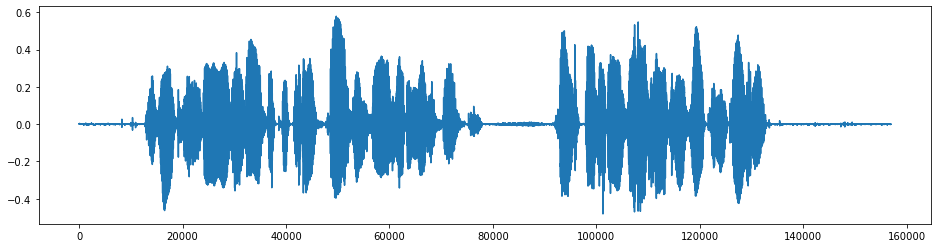

In [5]:
snd = parselmouth.Sound('O vento sul e o sol Passage for testing.wav')
plt.figure(figsize=(16,4))
plt.plot(snd.values.reshape(-1))
print(len(snd.values.reshape(-1)))
Audio(data=snd.values.reshape(-1), rate=snd.sampling_frequency)
print("Duration of audio in ms: " + str(snd.duration*1000))

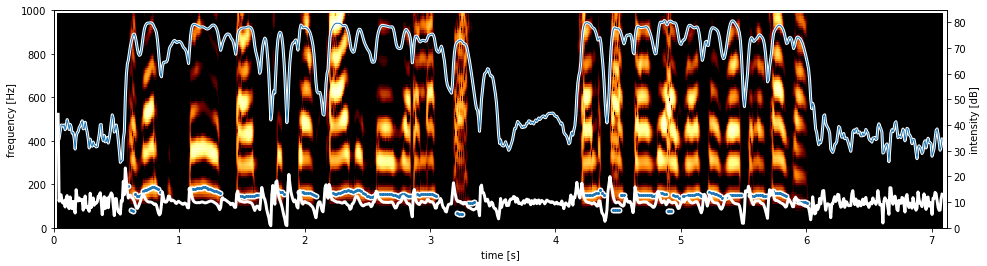

In [6]:
pitch = snd.to_pitch(pitch_floor=50)
pitch_values = pitch.selected_array['frequency']

pre_emphasized_snd = snd.copy()
pre_emphasized_snd.pre_emphasize()
spectrogram = pre_emphasized_snd.to_spectrogram(window_length=0.03, maximum_frequency=1000)
intensity = snd.to_intensity()

    
plt.figure(figsize=(16,4))
draw_pitch(pitch)
draw_spectrogram(spectrogram,dynamic_range=35)
plt.twinx()

draw_intensity(intensity)
plt.xlim([snd.xmin, snd.xmax])

plt.show()

In [8]:
configure_plotly_browser_state()
pyo.init_notebook_mode()
pyo.iplot(draw_interactive_spectrogram(spectrogram,intensity,pitch))


# Biblioteca para habilitar o selector de tempo para o arquivo de audio
import ipywidgets as widgets

# gera os limites de indices do seletor no tempo do arquivo de audio
index = (0, len(snd.values.reshape(-1))-1)
selection = widgets.SelectionRangeSlider(

            # converte o audio no tempo em segundos segundo a frequencia do arquivo .WAV
            options = np.around(np.array(range(0,len(snd.values.reshape(-1))))/snd.sampling_frequency,decimals=3),
            index = index,
            description = 'T',
            orientation = 'horizontal',
            layout={'width': '92.5%'}
        )
selection

SelectionRangeSlider(description='T', index=(0, 156941), layout=Layout(width='92.5%'), options=(0.0, 0.0, 0.0,…

In [9]:
Audio(data=snd.values.reshape(-1)[selection.index[0]:selection.index[1]], rate=snd.sampling_frequency,)

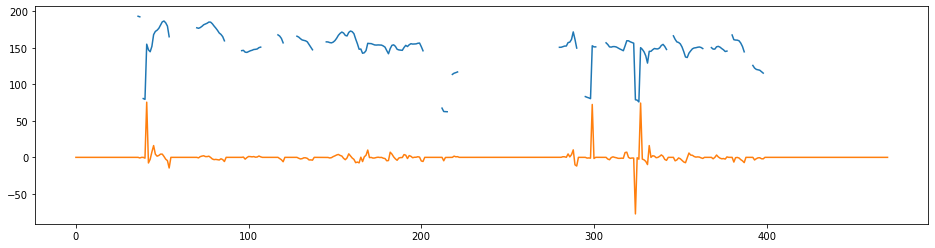

In [10]:
df = f0.f0_extraction_to_dataframe(pitch.selected_array['frequency'], np.int16(pitch.xs()*1000), pitch.selected_array['strength'], intensity.values.reshape(-1)/np.max(intensity.values.reshape(-1)), division=12)

plt.figure(figsize=(16,4))
df.freq.plot()
df.freq_accel.plot()

In [11]:
csv_midi = pitch_f0_tomidi(df)
midi_object = pm.csv_to_midi(csv_midi)
with open("example_converted.mid", "wb") as output_file:
    midi_writer = pm.FileWriter(output_file)
    midi_writer.write(midi_object)